# Analysis deep layer optogenetics 3

In [154]:
# works with saved datasets from deep_layer_stimulus_2

In [1]:
# the following two lines indicate that external functions are auto-reloaded as soon as they change. 
%load_ext autoreload
%autoreload 2
# Print statements 
from __future__ import print_function # Python 2.x

In [2]:
# General stuff:
import sys
import argparse
import os
import json
import numpy as np
import math
import psycopg2
import cPickle
import pandas as pd
import h5py

pd.options.mode.chained_assignment = None  # default='warn'

from datetime import date
from tqdm import tqdm_notebook

# Plotting:
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib as mpl
%matplotlib inline
from IPython.display import display, HTML

# External functions from subfolder /database_helpers. 
# as soon as you change something in there and press save, it will auto reload on next execution.
from database_helpers.psql_start import *
from database_helpers.create_tables import *
from database_helpers.write2tables import *
from postgres_analysis_helpers.general import *

# register pickle type to retrieve binary data from database
psycopg2.extensions.register_type(psycopg2.extensions.new_type(psycopg2.BINARY.values, 'BINARY-PICKLE', cast_pickle))

Loaded analysis helpers: General
Loaded postgres_analysis_helpers -> general


In [3]:
db_status = test_connect()
if db_status == False:
    print('Grrr... no database connection could be established.')
else:
    print('Yippiyeah! Database connection is established!')

Connecting to the PostgreSQL database...
Yippiyeah! Database connection is established!


In [4]:
# load the parameters to connect to data_1 
params = config()

## Analysis

Retrieve stimulus table for deep layer mice (**retro-cre**, **DIOCheta injections**)

In [5]:
salt_i_thresh = .1
salt_p_thresh = .05
inhib_p_thresh = .001 # arbitrary at the moment!

#### You now have: 
- autocorr_cells
- ratemaps_cells 
- obj_ratemaps_cells 
- bnt_scores_cells 
- spiketimes_tracking_cells


- tracking_cells
- lfp_cells

based on: 
- deep_layer_exc_filtered
- deep_layer_inhib_filtered
- deep_layer_rest_filtered

### Retrieve the stuff:

In [6]:
export_path_pickle  = r"C:\work\python\klusta_analysis\postgres_notebooks\export_dataframes"
export_path_pickle = "/".join(export_path_pickle.split("\\"))

In [7]:
# retrieve:
deep_layer_exc_filtered = pd.read_pickle(export_path_pickle + "/deep_layer_exc_filtered.pkl")
deep_layer_inhib_filtered = pd.read_pickle(export_path_pickle + "/deep_layer_inhib_filtered.pkl")
deep_layer_rest_filtered = pd.read_pickle(export_path_pickle + "/deep_layer_rest_filtered.pkl")

autocorr_cells = pd.read_pickle(export_path_pickle + "/autocorr_cells.pkl")
ratemaps_cells = pd.read_pickle(export_path_pickle + "/ratemaps_cells.pkl")
obj_ratemaps_cells = pd.read_pickle(export_path_pickle + "/obj_ratemaps_cells.pkl")
bnt_scores_cells = pd.read_pickle(export_path_pickle + "/bnt_scores_cells.pkl")
spiketimes_tracking_cells = pd.read_pickle(export_path_pickle + "/spiketimes_tracking_cells.pkl")
obj_spiketimes_tracking_cells = pd.read_pickle(export_path_pickle + "/obj_spiketimes_tracking_cells.pkl")
tracking_cells = pd.read_pickle(export_path_pickle + "/tracking_cells.pkl")
obj_tracking_cells = pd.read_pickle(export_path_pickle + "/obj_tracking_cells.pkl")

lfp_cells = pd.read_pickle(export_path_pickle + "/lfp_cells.pkl")

In [8]:
hd_tuning_cells = pd.read_pickle(export_path_pickle + "/hd_tuning_cells.pkl")

In [9]:
obj_hd_tuning_cells = pd.read_pickle(export_path_pickle + "/obj_hd_tuning_cells.pkl")

### Prepare plots for autocorr indices, bnt scores 

In [10]:
# prepare for plotting
label = {0: 'All cells'}
autocorr_cells['all_cells'] = np.zeros((len(autocorr_cells))) # generic column if you want to plot seaborn summary over all animals 
autocorr_cells['all_cells']= autocorr_cells['all_cells'].map(label)

bnt_scores_cells['all_cells'] = np.zeros((len(bnt_scores_cells))) 
bnt_scores_cells['all_cells']= bnt_scores_cells['all_cells'].map(label)

#### Plot autocorr indices for filtered datasets

Generating figure for: Burst Index


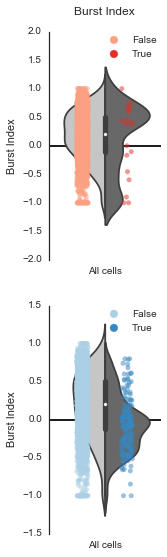

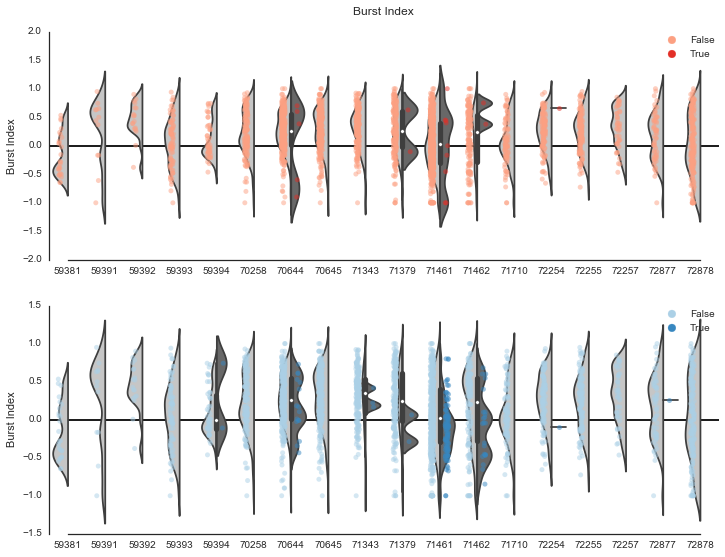

Generating figure for: Theta Index


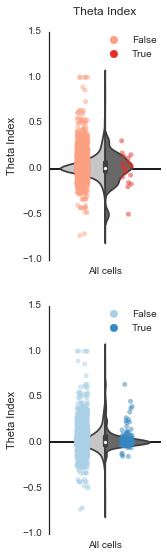

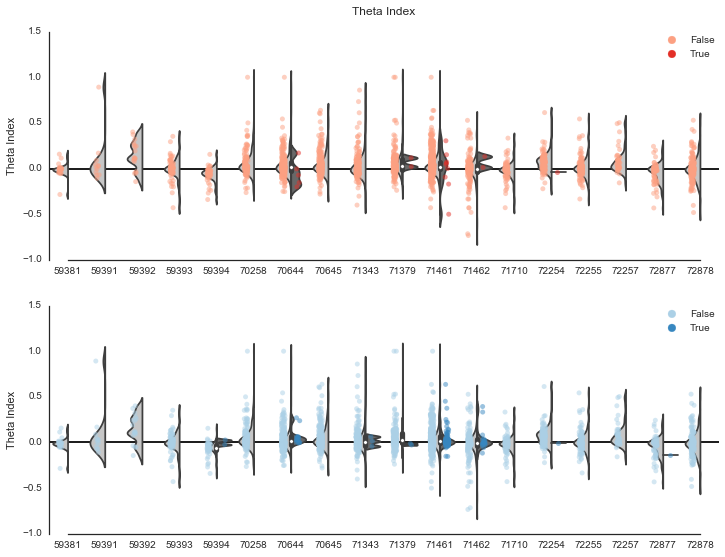

In [200]:
# what to plot
comparisons_dict = {'theta_idx':'Theta Index','burst_idx1':'Burst Index'}
# generate plots
autocorr_cells_subset = autocorr_cells[['animal_id','inhibited','excited','theta_idx','burst_idx1','all_cells']]
for i in comparisons_dict:
    print('Generating figure for: {}'.format(comparisons_dict[i]))
    plot_comparisons(autocorr_cells_subset,i,comparisons_dict[i],'all_cells',(2,9))
    plot_comparisons(autocorr_cells_subset,i,comparisons_dict[i],'animal_id',(12,9))

#### Plot BNT scores for filtered datasets

Generating figure for: Information Rate


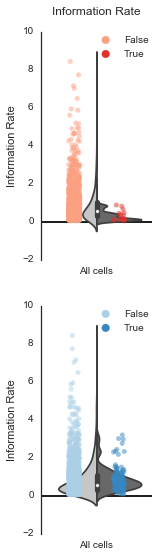

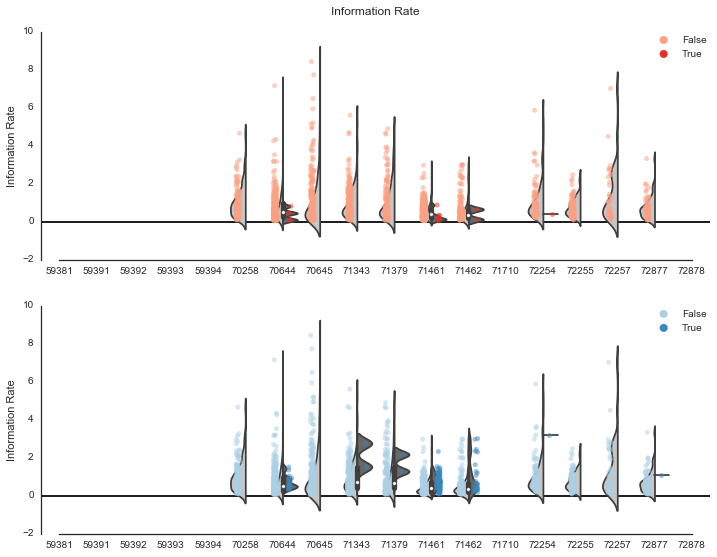

Generating figure for: Speed Score


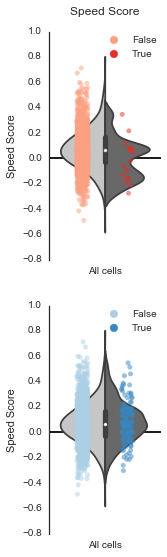

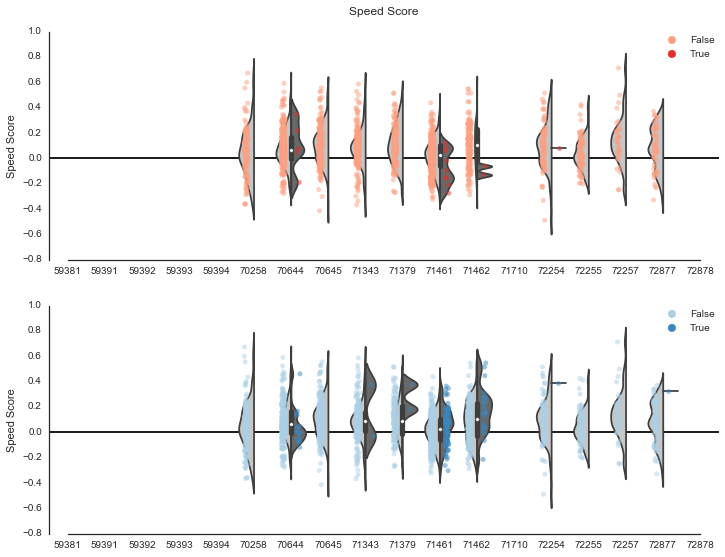

Generating figure for: Information Content


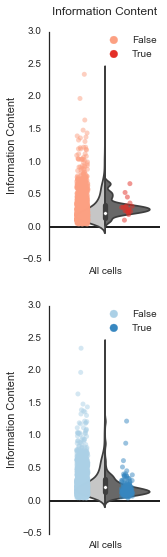

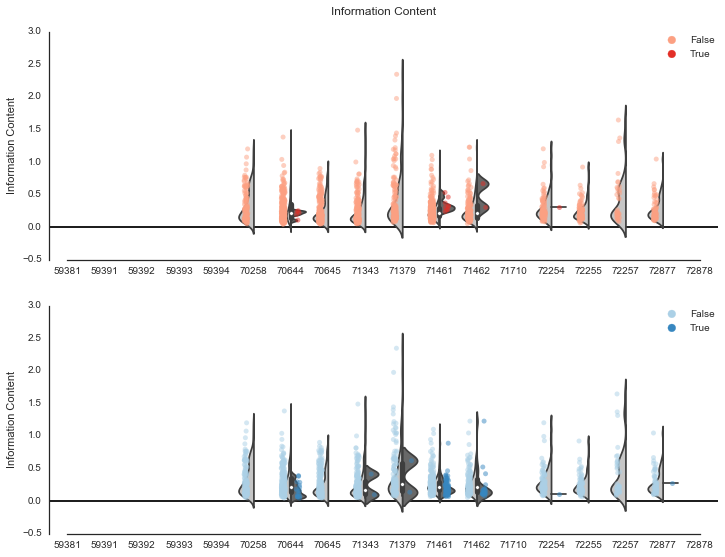

Generating figure for: Peak Rate


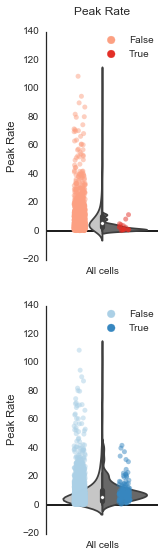

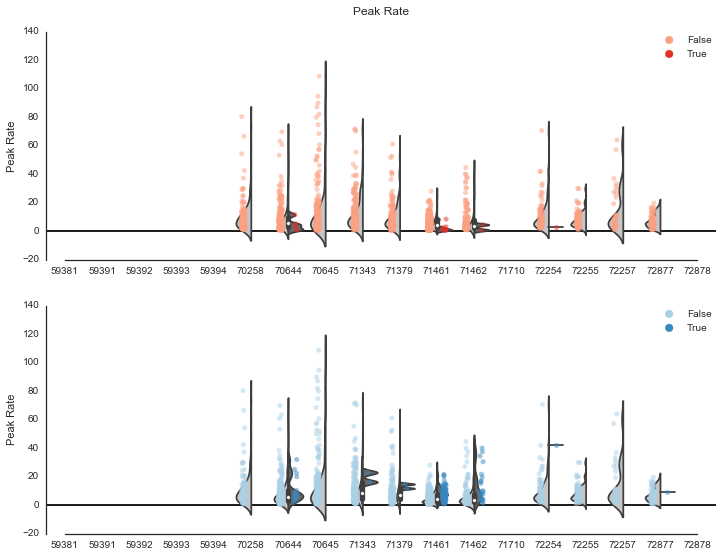

Generating figure for: Mean Rate


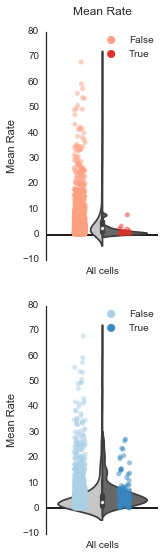

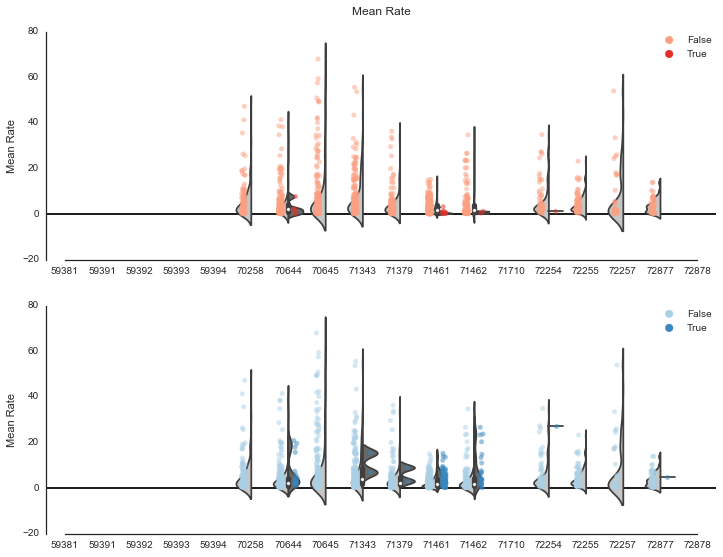

Generating figure for: Border Score


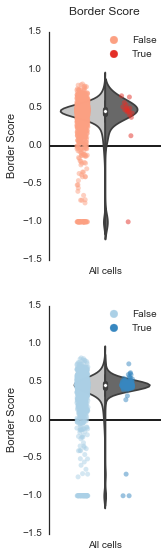

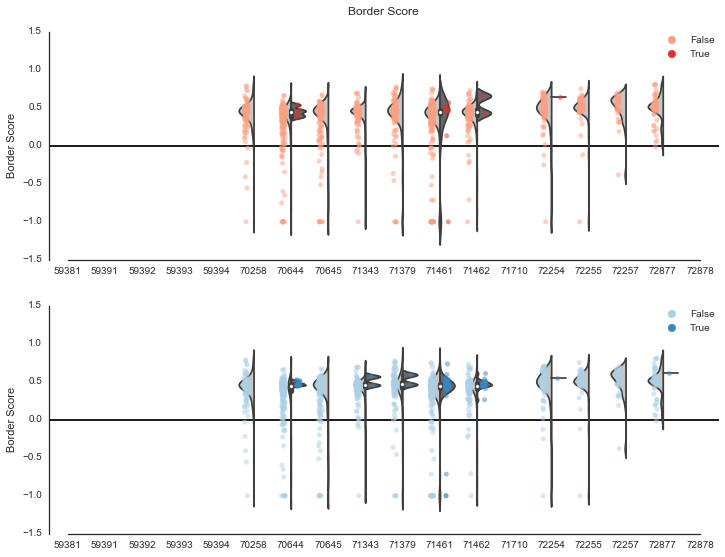

Generating figure for: Mean Vector Length (MVL)


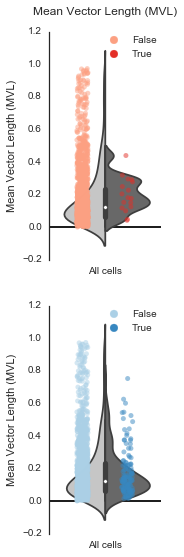

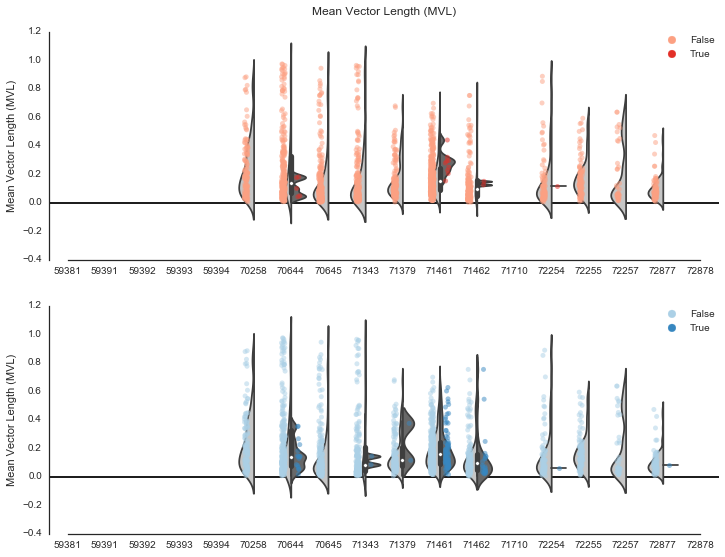

Generating figure for: Grid Score


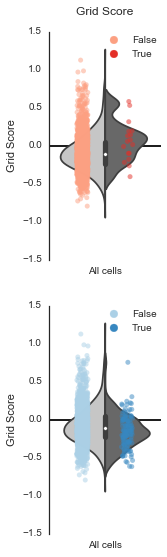

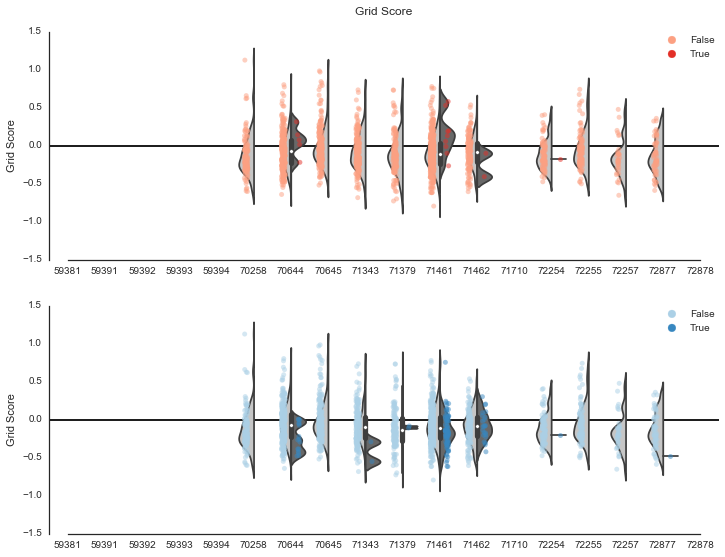

In [166]:
# what to plot
comparisons_dict = {'gridscore':'Grid Score','borderscore':'Border Score','mvl':'Mean Vector Length (MVL)',
                   'informationcontent':'Information Content','informationrate':'Information Rate','speedscore':'Speed Score',
                   'meanrate':'Mean Rate','peakrate':'Peak Rate'}
# generate plots
#gridscore,borderscore,mvl,informationcontent,informationrate
bnt_scores_cells_subset = bnt_scores_cells[['animal_id','inhibited','excited','gridscore','borderscore',
                                            'mvl','informationcontent','informationrate', 'all_cells','speedscore',
                                            'meanrate','peakrate']]
for i in comparisons_dict:
    print('Generating figure for: {}'.format(comparisons_dict[i]))
    plot_comparisons(bnt_scores_cells_subset,i,comparisons_dict[i],'all_cells',(2,9))
    plot_comparisons(bnt_scores_cells_subset,i,comparisons_dict[i],'animal_id',(12,9))

### Plot spike time histograms and other stuff for excited and inhibited cells

#### Excited cells

In [203]:
# initialize figure parameters ... 
if len(deep_layer_exc_filtered) > 25: 
    number_plots = 25
else:
    number_plots = len(deep_layer_exc_filtered)
layout_plots = [5,5]       


Generating plot...


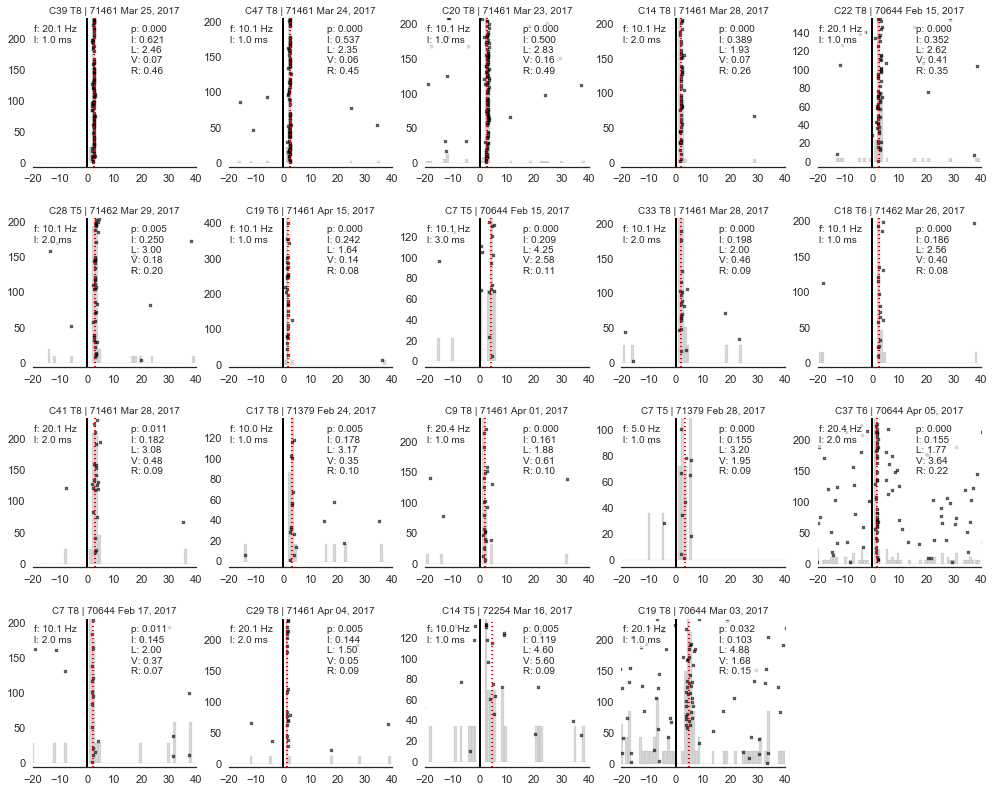

In [204]:
create_spike_plots_stimulus(deep_layer_exc_filtered,number_plots,layout_plots)

#### Draw excited cells spike-path plots and  ratemaps


Generating plot ...


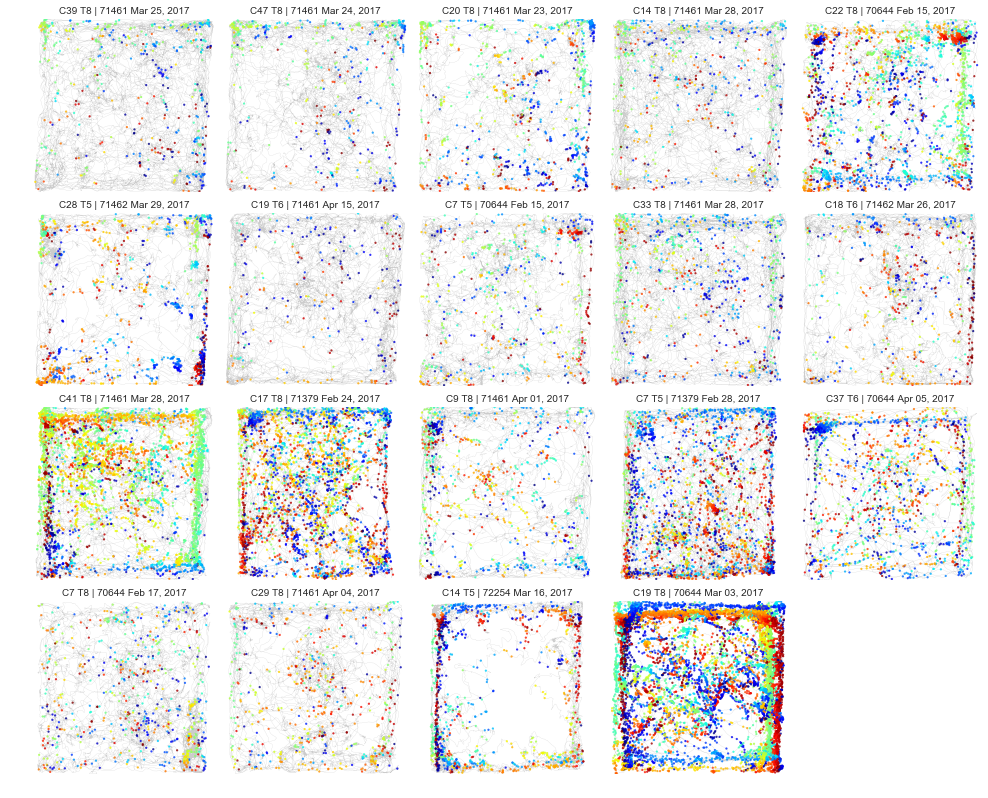

In [205]:
draw_path_spike_plots(spiketimes_tracking_cells,tracking_cells,number_plots,speed_cutoff=5.,offset=0,plot_hd=True)


Generating plot ...


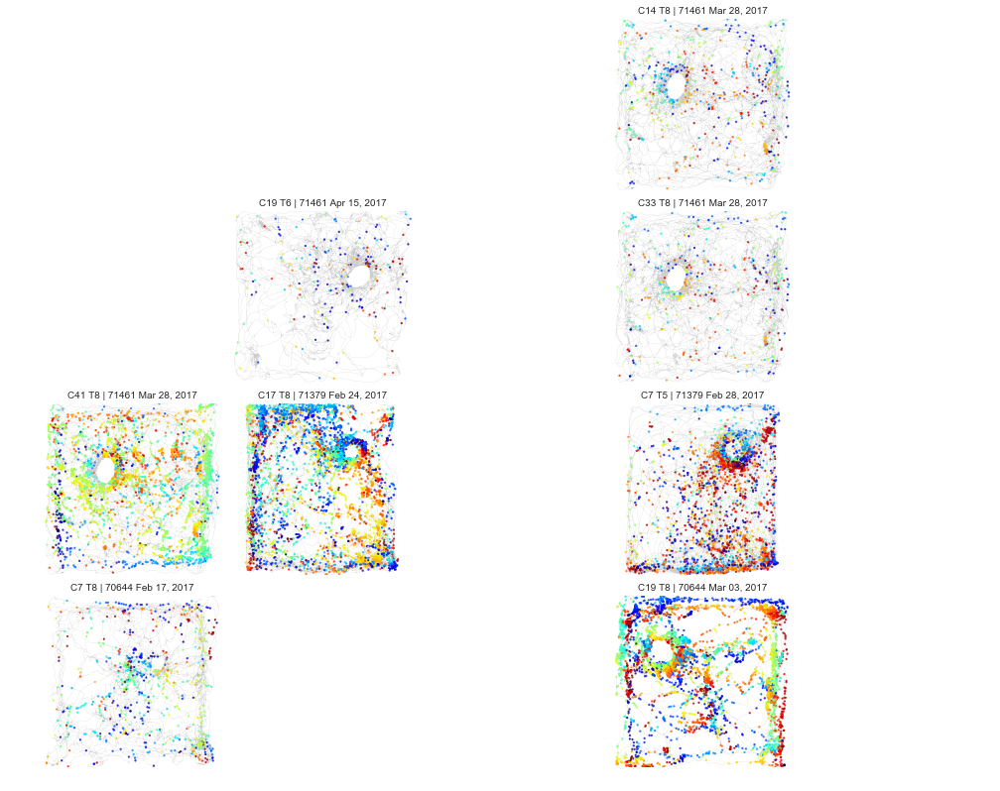

In [206]:
draw_path_spike_plots(obj_spiketimes_tracking_cells,obj_tracking_cells,number_plots,speed_cutoff=5.,offset=0,plot_hd=True)


Generating plot ...


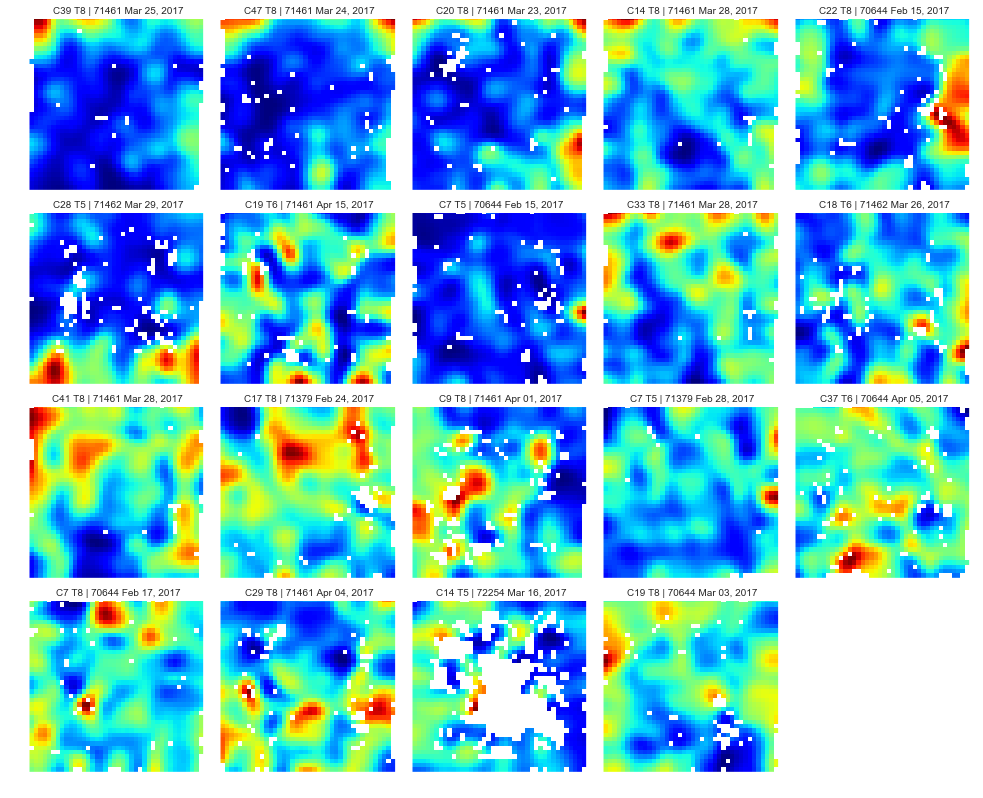

In [171]:
draw_ratemaps(ratemaps_cells,'masked_ratemap',number_plots,0)


Generating plot ...


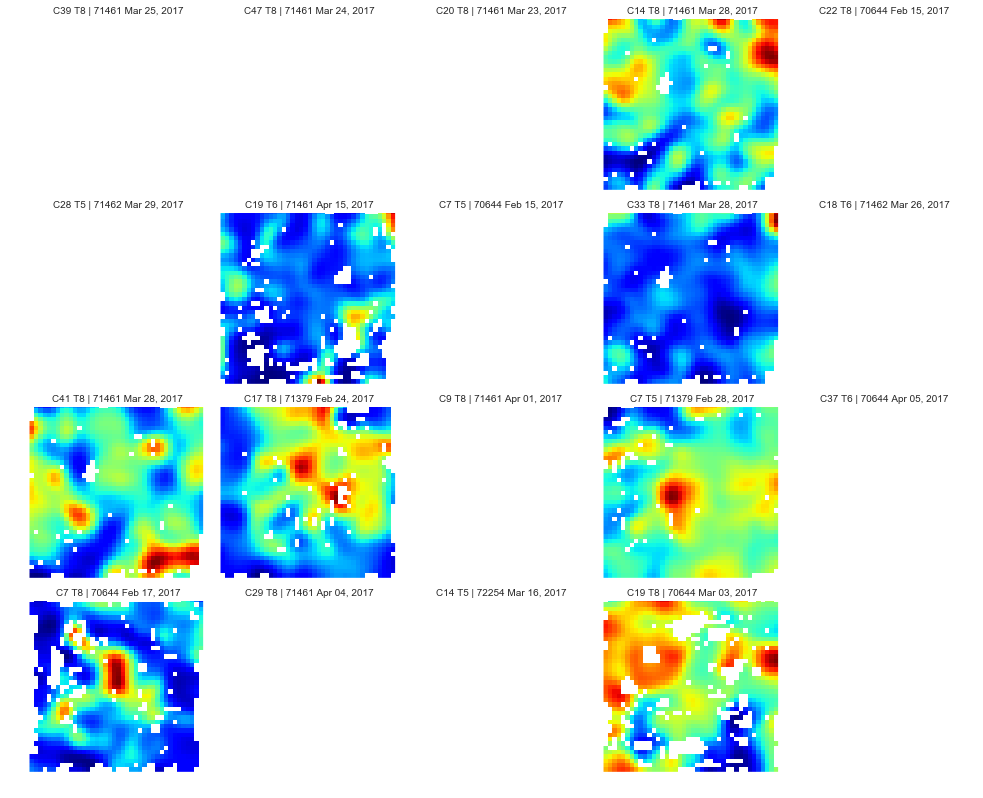

In [172]:
draw_ratemaps(obj_ratemaps_cells,'masked_ratemap',number_plots,0)


Generating plot ...


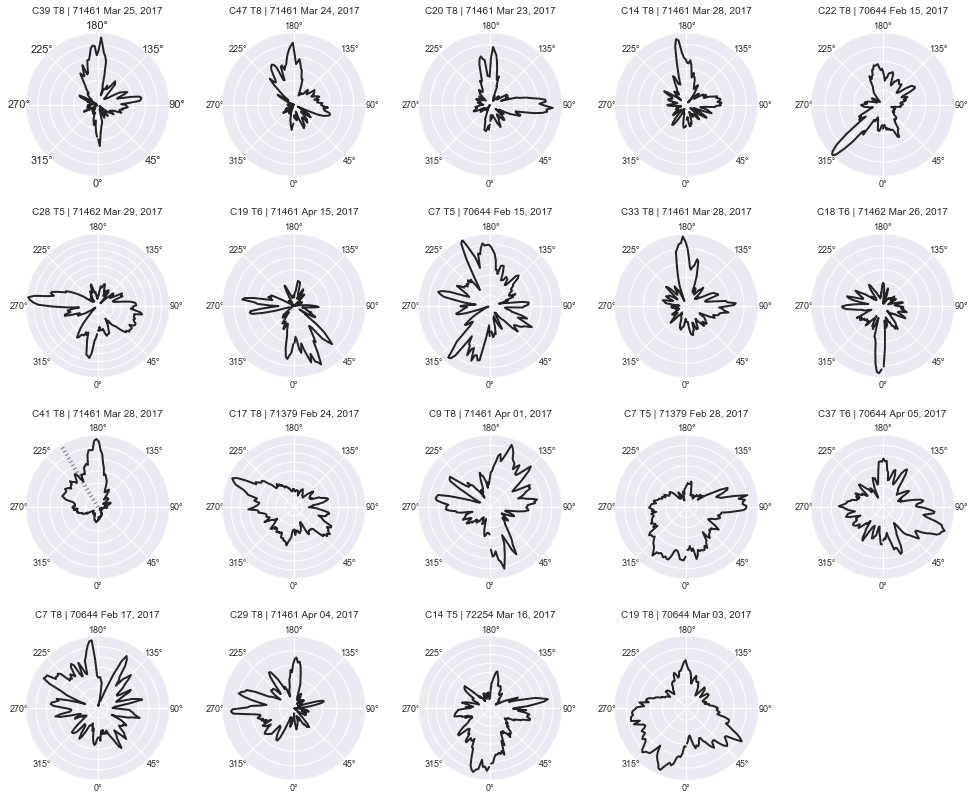

In [173]:
draw_hd_tuning_curves(hd_tuning_cells,number_plots,0)


Generating plot ...


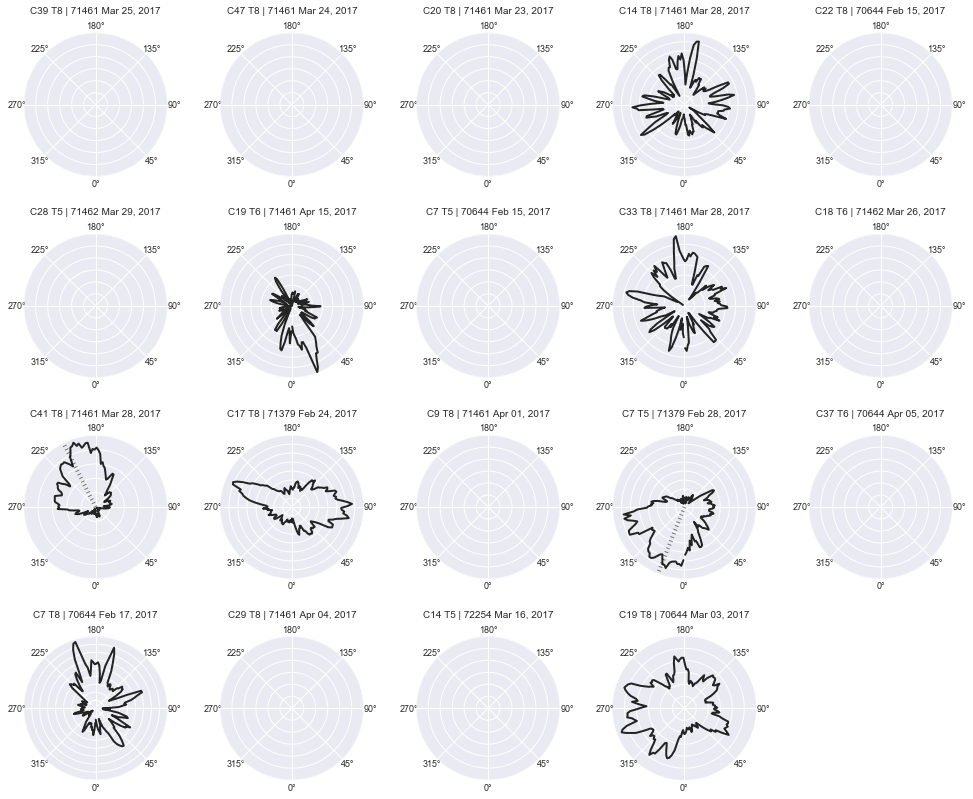

In [174]:
draw_hd_tuning_curves(obj_hd_tuning_cells,number_plots,0)

#### Inhibited cells

In [208]:
# initialize figure parameters ... 
if len(deep_layer_inhib_filtered) > 25: 
    number_plots = 25
else:
    number_plots = len(deep_layer_inhib_filtered)
layout_plots = [5,5]  


Generating plot...


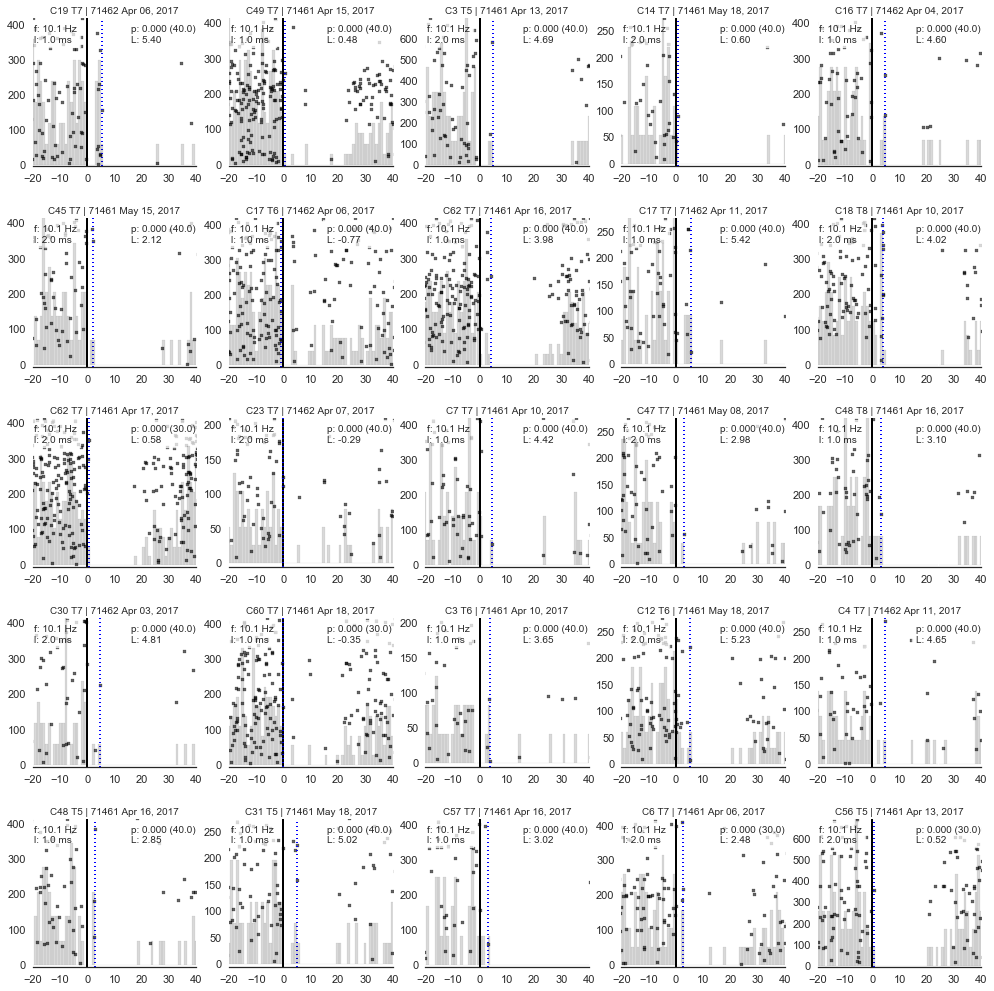

In [176]:
create_spike_plots_stimulus(deep_layer_inhib_filtered,number_plots,layout_plots)

#### Draw inhibited cells spike-path plots and ratemaps 

In [209]:
offset = len(deep_layer_exc_filtered)


Generating plot ...


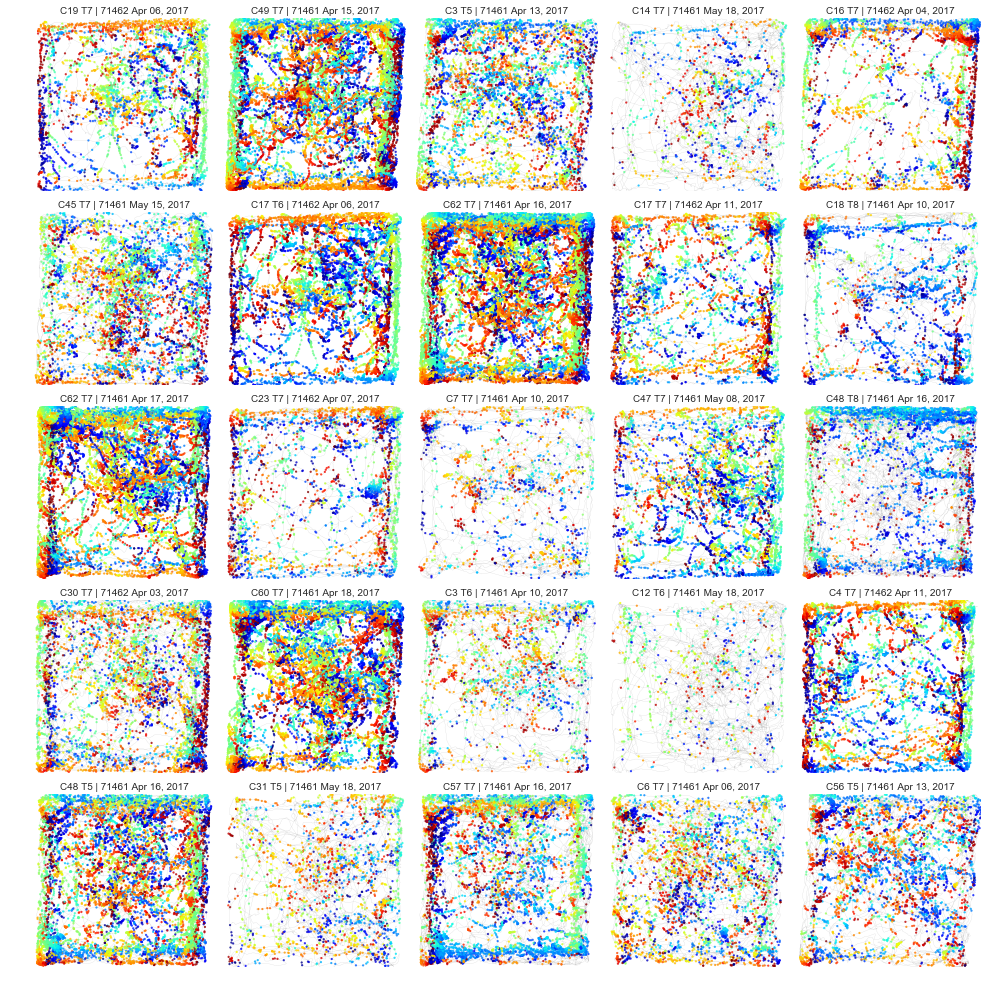

In [210]:
draw_path_spike_plots(spiketimes_tracking_cells,tracking_cells,number_plots,speed_cutoff=5.,offset=offset,plot_hd=True)


Generating plot ...


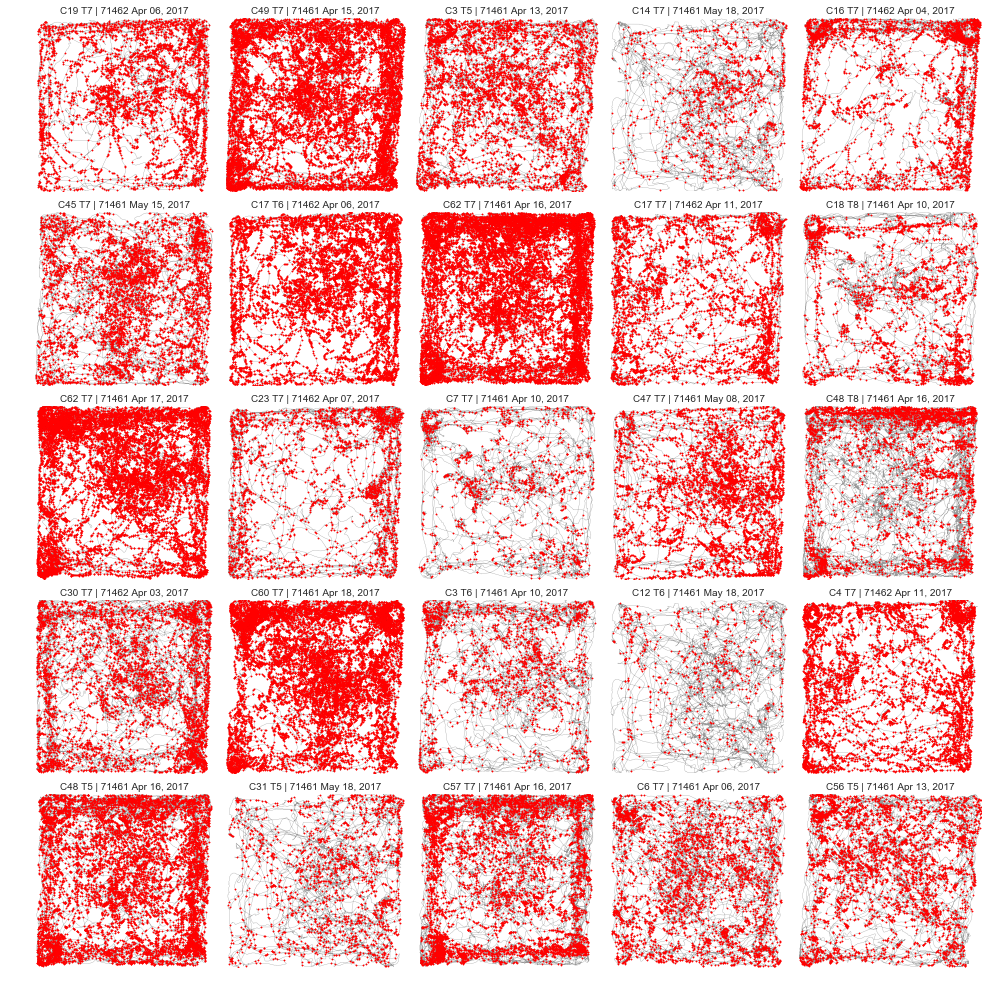

In [179]:
draw_path_spike_plots(spiketimes_tracking_cells,tracking_cells,number_plots,speed_cutoff=5.,offset=offset,plot_hd=False)


Generating plot ...


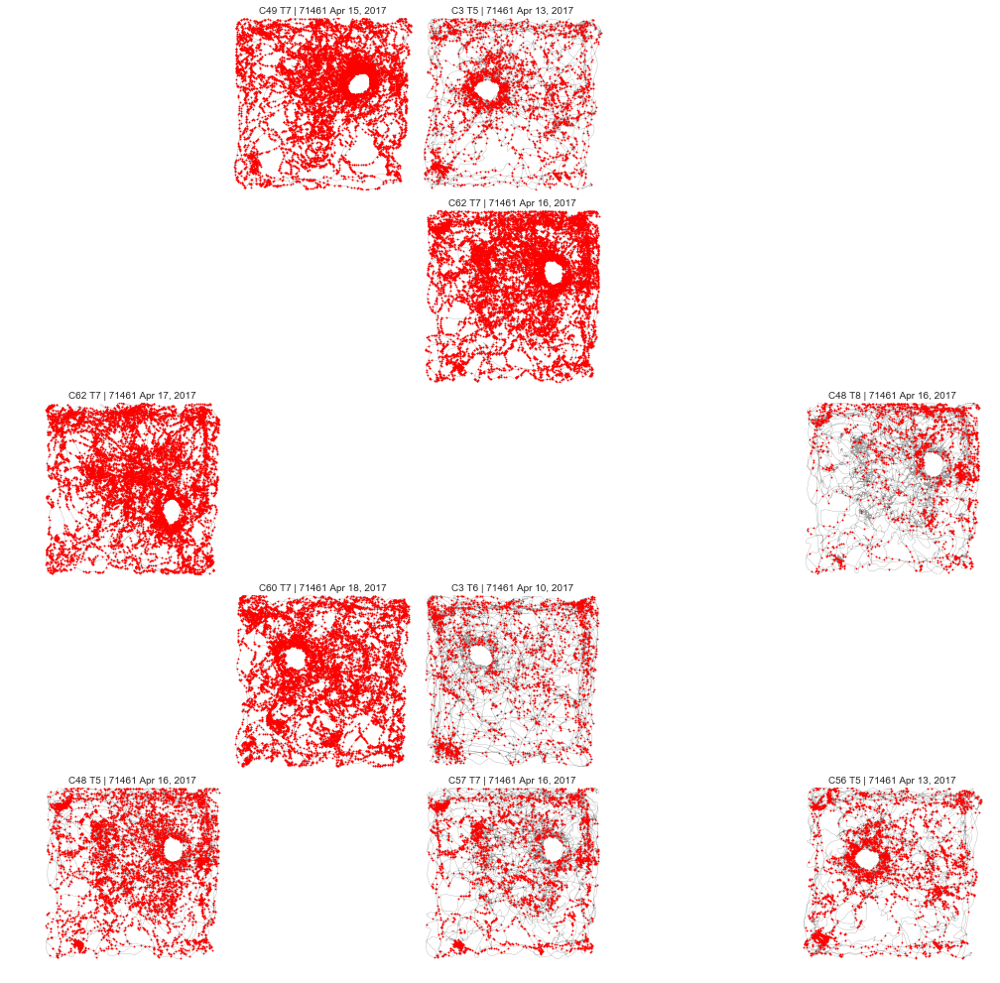

In [180]:
draw_path_spike_plots(obj_spiketimes_tracking_cells,obj_tracking_cells,number_plots,speed_cutoff=5.,offset=offset)


Generating plot ...


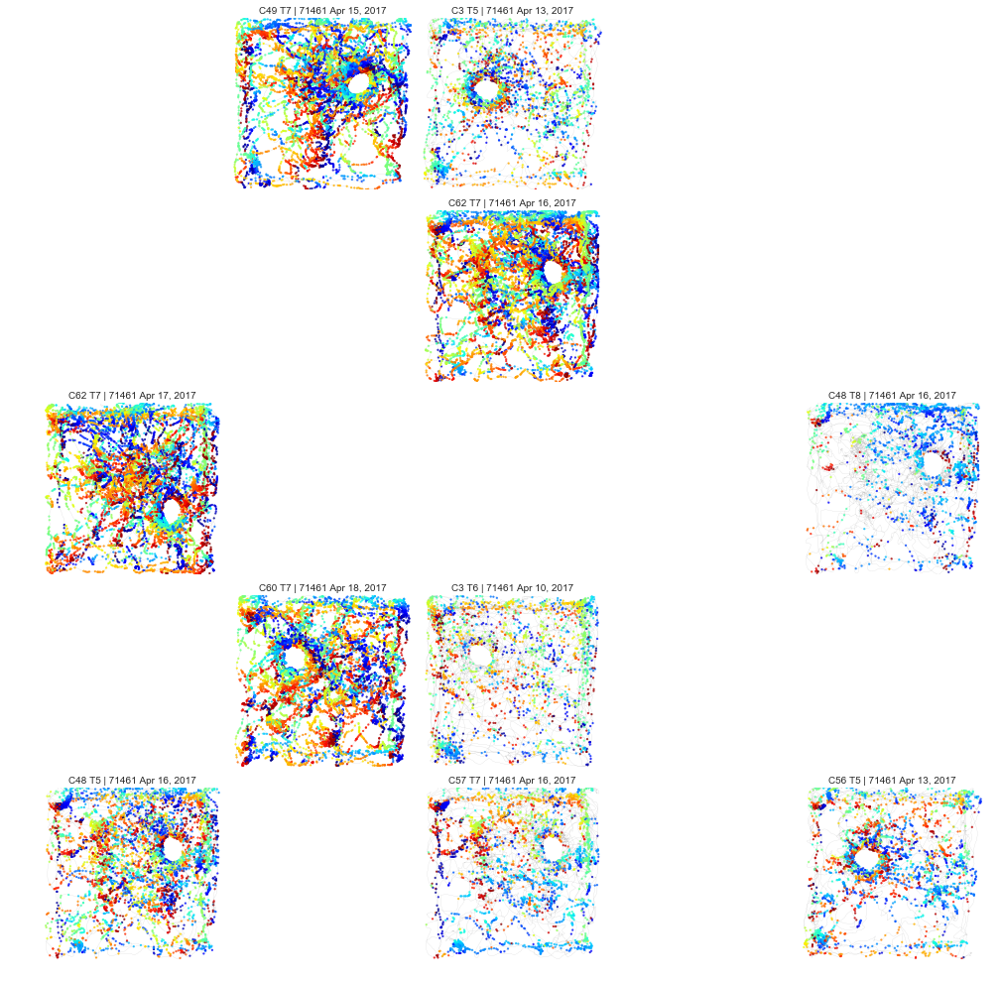

In [181]:
draw_path_spike_plots(obj_spiketimes_tracking_cells,obj_tracking_cells,number_plots,speed_cutoff=5.,offset=offset,plot_hd=True)

Loaded postgres_analysis_helpers -> general



Generating plot ...


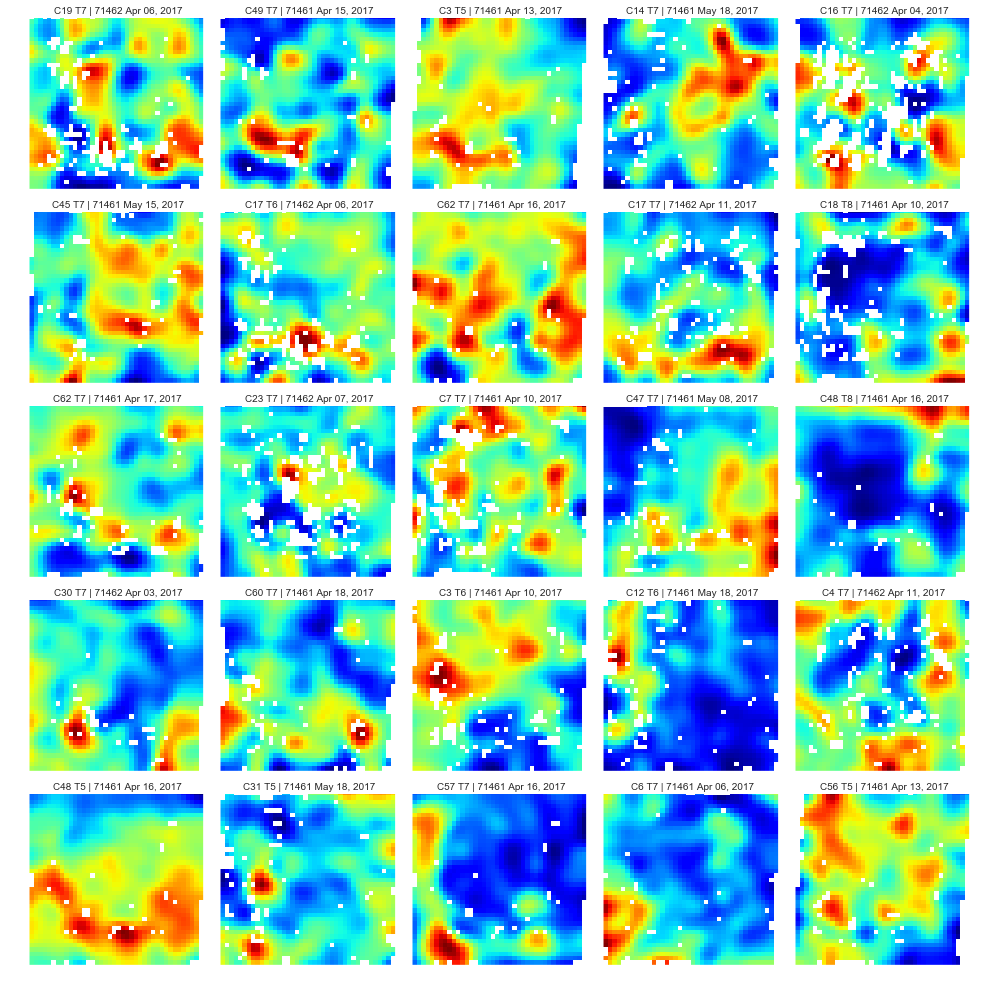

In [182]:
draw_ratemaps(ratemaps_cells,'masked_ratemap',number_plots,offset)


Generating plot ...


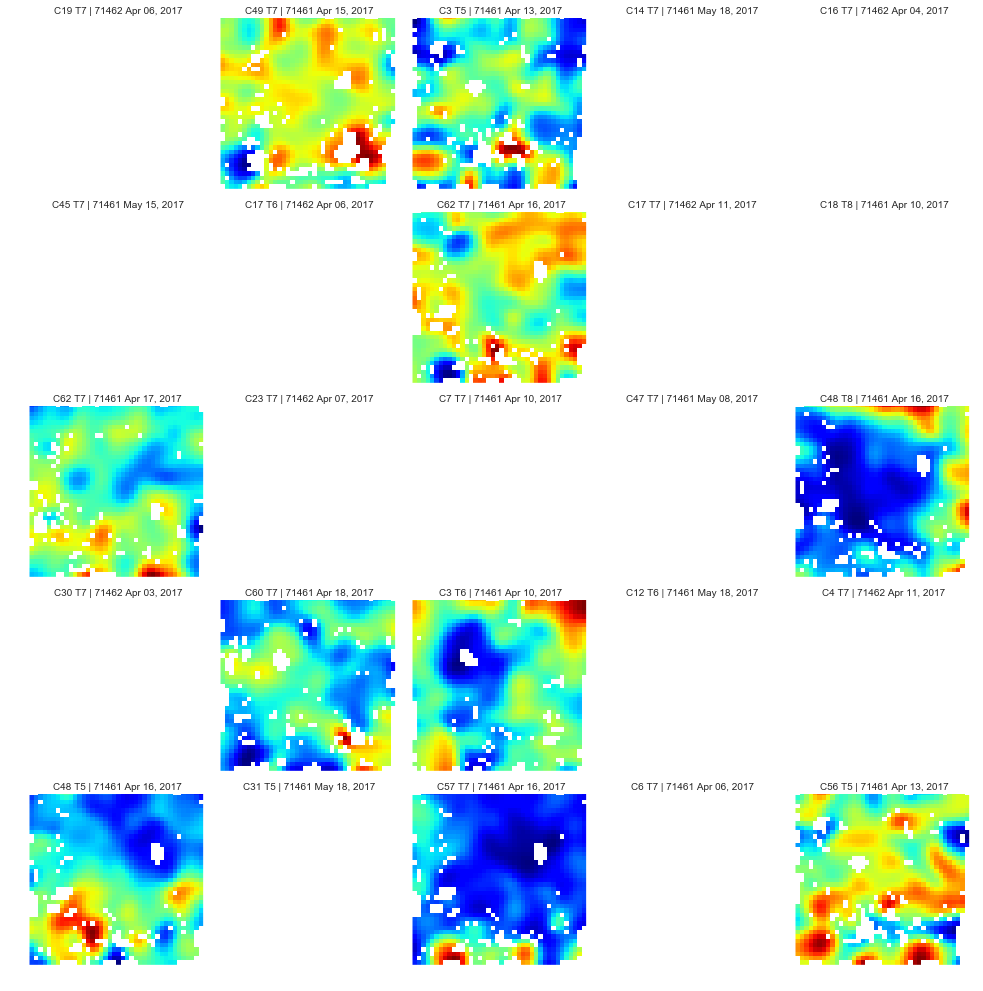

In [183]:
draw_ratemaps(obj_ratemaps_cells,'masked_ratemap',number_plots,offset)


Generating plot ...


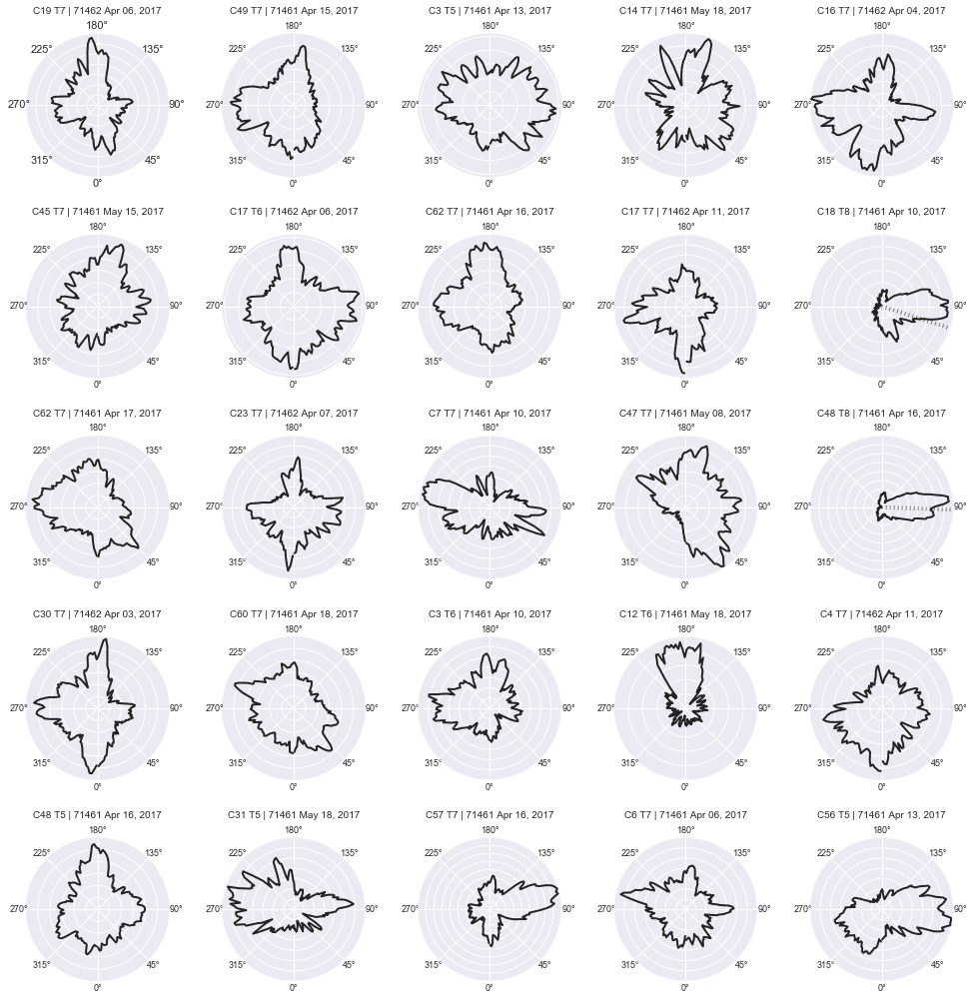

In [184]:
draw_hd_tuning_curves(hd_tuning_cells,number_plots,offset)


Generating plot ...


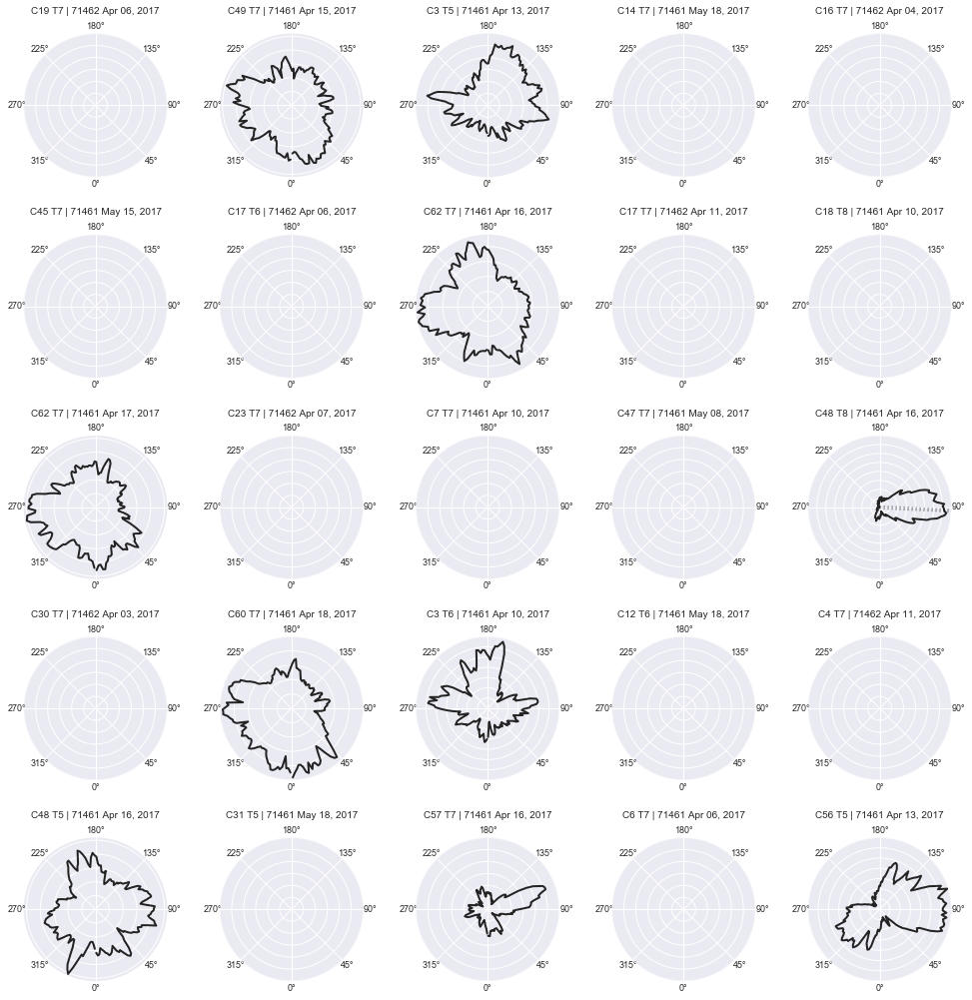

In [185]:
draw_hd_tuning_curves(obj_hd_tuning_cells,number_plots,offset)

### update timeline

In [11]:
all_cells_filtered = pd.concat([deep_layer_exc_filtered, deep_layer_inhib_filtered, deep_layer_rest_filtered], axis=0) # vertically join it with the rest

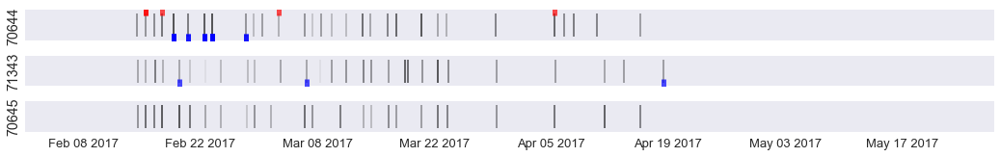

In [16]:
# plot stimulated cells over time for each animal:
figure = plt.figure(figsize=(18,15))
sns.set(font_scale=1.3)
sns.set_style('dark')
counter_fig = 1

animals_test = ['70645','70644','71343']

for animal in all_cells_filtered.animal_id.unique():
    exc_found = len(all_cells_filtered.session_ts[(all_cells_filtered.animal_id == animal) & 
                                             (all_cells_filtered.excited == True)]) 
                                                           
    inhib_found = len(all_cells_filtered.session_ts[(all_cells_filtered.animal_id == animal) & 
                                             (all_cells_filtered.inhibited == True)])        
     
    if animal in animals_test:
        exc_found = 1
    else:
        exc_found = 0; inhib_found = 0
        
    if (exc_found > 0 or inhib_found > 0):        
        ax = figure.add_subplot(len(all_cells_filtered.animal_id.unique()),1,counter_fig)
        ax.scatter(all_cells_filtered.session_ts[(all_cells_filtered.animal_id == animal)].values,
                   np.ones(len(all_cells_filtered[(all_cells_filtered.animal_id == animal)])),
                   s=570,c='k',label=animal,marker='|',alpha=.5,lw=.2)
        
        # draw marker for excited
        ax.scatter(all_cells_filtered.session_ts[(all_cells_filtered.animal_id == animal) & 
                                                     (all_cells_filtered.excited == True)].values,
                   all_cells_filtered.excited[(all_cells_filtered.animal_id == animal) & 
                                                     (all_cells_filtered.excited == True)].astype(int)+.5,
                   s=150,c='r',label=animal,marker='|',alpha=.7,linewidth=5)
        
        # draw marker for inhibited
        ax.scatter(all_cells_filtered.session_ts[(all_cells_filtered.animal_id == animal) & 
                                                      (all_cells_filtered.inhibited == True)].values,
                   all_cells_filtered.inhibited[(all_cells_filtered.animal_id == animal) & 
                                                   (all_cells_filtered.inhibited == True)].astype(int)-.5,
                   s=200,c='b',label=animal,marker='|',alpha=.7,linewidth=5)
        
        #ax.axvline(x=first_recording,linewidth=2, color='k')
        ax.get_yaxis().set_ticks([])
        [label.set_visible(False) for label in ax.get_xticklabels()]
        ax.set_ylim(0.5,1.5)
        ax.set_xlim([date(2017, 2, 1), date(2017, 5, 28)])
        ax.set_ylabel(animal)
        counter_fig +=1 
        sns.despine(bottom=True)
[label.set_visible(True) for label in ax.get_xticklabels()]     
figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)
plt.show()

### Play some more with the data

In [188]:
len(deep_layer_exc_filtered)

19

In [189]:
len(deep_layer_inhib_filtered)

157

In [190]:
len(deep_layer_rest_filtered)

2323

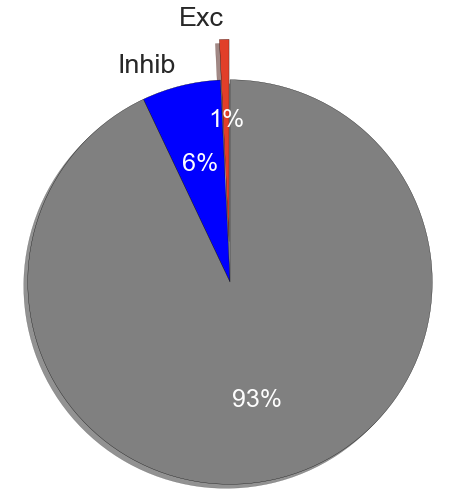

In [191]:
figure = plt.figure(figsize=(8,8))
sum_cells = float(len(deep_layer_exc_filtered)+ len(deep_layer_inhib_filtered)+ len(deep_layer_rest_filtered))
# draw pie chart of excited and inhibited cells 
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Exc', 'Inhib', ''
colors = ["#E13F29", "blue", "grey"]

sizes = [len(deep_layer_exc_filtered)/sum_cells, len(deep_layer_inhib_filtered)/sum_cells, len(deep_layer_rest_filtered)/sum_cells]
explode = (0.2, 0, 0)
ax = figure.add_subplot(1,1,1)
patches, texts, autotexts = ax.pie(sizes, explode=explode, labels=labels, autopct='%1.0f%%',
        shadow=True, startangle=90,colors=colors)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
for no,i in enumerate(texts):
    texts[no].set_fontsize(27)
    autotexts[no].set_fontsize(25)
    autotexts[no].set_color('white')
plt.show()

### latency histograms 

deep_layer_exc_filtered
deep_layer_inhib_filtered
deep_layer_rest_filtered

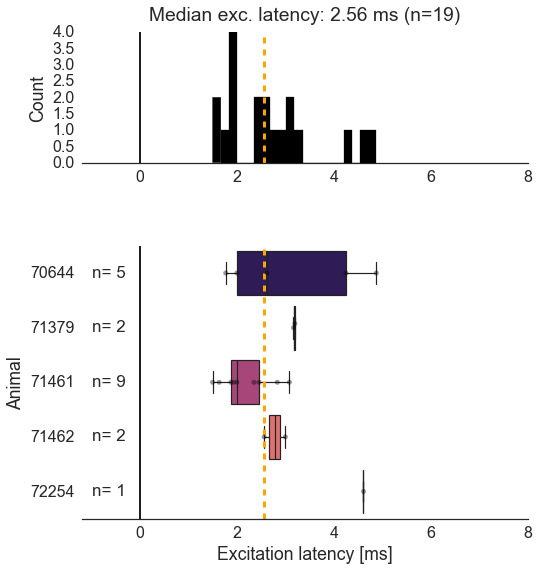

In [192]:
sns.set(font_scale=1.6)
sns.set_style('white')
figure = plt.figure(figsize=(8,10))

filtered_count = deep_layer_exc_filtered.groupby(['animal_id']).count() # counts per animal

ax1 = plt.subplot2grid((8,1), (1,0),rowspan=2)
ax1.hist(deep_layer_exc_filtered.ex_latency_median,20,color='k',alpha=1)
ax1.axvline(x=np.median(deep_layer_exc_filtered.ex_latency_median),color='orange',linestyle='--',lw=3)
ax1.axvline(x=0,color='black',linestyle='-')

ax1.set_title('Median exc. latency: {:.2f} ms (n={})'.format(np.median(deep_layer_exc_filtered.ex_latency_median),
                                                             len(deep_layer_exc_filtered),fontsize=16),y=1.05)
ax1.set_xlim(-1.2,8)
ax1.set_ylabel('Count')

# second axis - boxplot of inhibition latencies
ax2 = plt.subplot2grid((8,1), (4,0),rowspan=4)
sns.boxplot(y='animal_id', x='ex_latency_median', data=deep_layer_exc_filtered,
            palette="magma",linewidth=1.2,fliersize=0,orient='h')
sns.swarmplot(y='animal_id', x='ex_latency_median', data=deep_layer_exc_filtered,
            size=5,color='k',alpha=.4,orient='h')

# annotate with n per animal:
labels = ax2.get_yticklabels()
for no,label in enumerate(labels):
    ax2.text(-.98,1*no+.07,'n= {}'.format(filtered_count.loc[label.get_text()].ex_latency_median),fontsize=17)
    
ax2.set_xlabel('Excitation latency [ms]');plt.ylabel('Animal')
ax2.axvline(x=np.median(deep_layer_exc_filtered.ex_latency_median),color='orange',linestyle='--',lw=3)
ax2.axvline(x=0,color='black',linestyle='-')
ax2.set_xlim(-1.2,8)
figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
sns.despine(left=True)

plt.show()

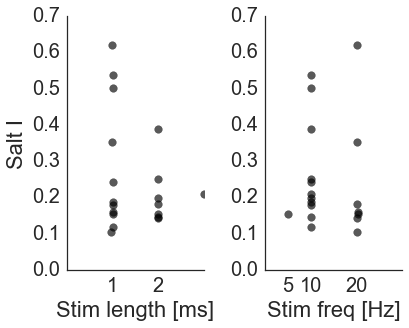

In [193]:
# plot different stim protocols against outcome of stimulation 
sns.set(font_scale=2)
sns.set_style('white')
figure = plt.figure(figsize=(6,10))

ax1 = figure.add_subplot(2,2,1)
ax1.scatter(deep_layer_exc_filtered.stim_length,deep_layer_exc_filtered.salt_i,color='k',alpha=.65,s=60)
ax1.set_ylabel('Salt I')
ax1.set_xlabel('Stim length [ms]')
ax1.set_xlim(0,3)
locs = ax1.get_xticks() 
ax1.set_xticks([locs[2],locs[4]]) 
ax2 = figure.add_subplot(2,2,2)
ax2.scatter(deep_layer_exc_filtered.stim_freq,deep_layer_exc_filtered.salt_i,color='k',alpha=.65,s=60)
ax2.set_xlabel('Stim freq [Hz]')
ax2.set_xlim(0,30)
locs = ax2.get_xticks() 
ax2.set_xticks([locs[1],locs[2],locs[4]]) 

figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.45, hspace=None)
sns.despine()

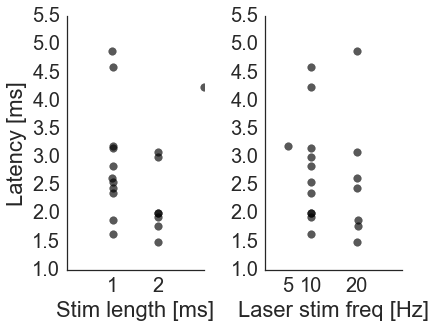

In [194]:
# plot different stim protocols against outcome of stimulation 
sns.set(font_scale=2)
sns.set_style('white')
figure = plt.figure(figsize=(6,10))

ax1 = figure.add_subplot(2,2,1)
ax1.scatter(deep_layer_exc_filtered.stim_length,deep_layer_exc_filtered.ex_latency_median,color='k',alpha=.65,s=60)
ax1.set_ylabel('Latency [ms]')
ax1.set_xlabel('Stim length [ms]')
ax1.set_xlim(0,3)
locs = ax1.get_xticks() 
ax1.set_xticks([locs[2],locs[4]]) 
ax2 = figure.add_subplot(2,2,2)
ax2.scatter(deep_layer_exc_filtered.stim_freq,deep_layer_exc_filtered.ex_latency_median,color='k',alpha=.65,s=60)
ax2.set_xlabel('Laser stim freq [Hz]')
ax2.set_xlim(0,30)
locs = ax2.get_xticks() 
ax2.set_xticks([locs[1],locs[2],locs[4]]) 

figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.45, hspace=None)
sns.despine()



#### ... for inhibition 

C:\Users\horsto\AppData\Local\Continuum\Miniconda2\envs\analysis\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


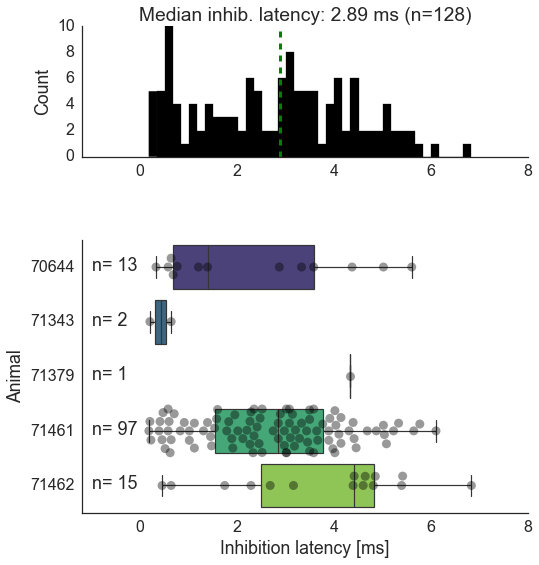

In [195]:
sns.set(font_scale=1.6)
sns.set_style('white')
figure = plt.figure(figsize=(8,10))

filtered_change_point = deep_layer_inhib_filtered.change_point_ms.values
filtered_change_point[filtered_change_point <= 0] = np.nan
filtered_change_point[filtered_change_point > 8] = np.nan

deep_layer_inhib_filtered = deep_layer_inhib_filtered.drop('change_point_ms', 1)
deep_layer_inhib_filtered['change_point_ms'] = filtered_change_point
df = deep_layer_inhib_filtered[np.isfinite(deep_layer_inhib_filtered['change_point_ms'])]
# df contains deep_layer_inhib_filtered with change_point_filtered for > 0 ms and <= 8ms
filtered_count = df.groupby(['animal_id']).count() # counts per animal

ax1 = plt.subplot2grid((8,1), (1,0),rowspan=2)
ax1.hist(df.change_point_ms,40,color='k',alpha=1)
ax1.axvline(x=np.median(df.change_point_ms),color='green',linestyle='--',lw=3)
ax1.set_title('Median inhib. latency: {:.2f} ms (n={})'.format(np.median(df.change_point_ms),
                                                             len(df),fontsize=11))
ax1.set_xlim(-1.2,8)
ax1.set_ylabel('Count')

# second axis - boxplot of inhibition latencies
ax2 = plt.subplot2grid((8,1), (4,0),rowspan=4)
sns.boxplot(y='animal_id', x='change_point_ms', data=df,
            palette="viridis",linewidth=1.2,fliersize=0,orient='h')
sns.swarmplot(y='animal_id', x='change_point_ms', data=df,
            size=9,color='k',alpha=.4,orient='h')

# annotate with n per animal:
labels = ax2.get_yticklabels()
for no,label in enumerate(labels):
    ax2.text(-.98,1*no+.07,'n= {}'.format(filtered_count.loc[label.get_text()].change_point_ms),fontsize=18)
    
ax2.set_xlabel('Inhibition latency [ms]');plt.ylabel('Animal')
ax2.set_xlim(-1.2,8)
figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
sns.despine()

plt.show()

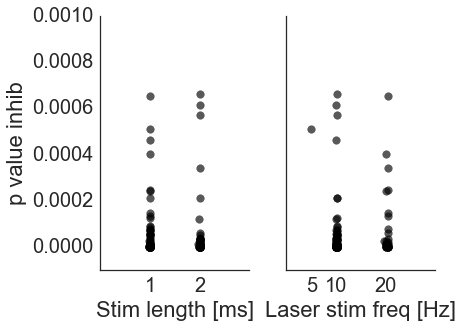

In [196]:
# plot different stim protocols against outcome of stimulation 
sns.set(font_scale=2)
sns.set_style('white')
figure = plt.figure(figsize=(6,10))


ax1 = figure.add_subplot(2,2,1)
ax1.scatter(deep_layer_inhib_filtered.stim_length,deep_layer_inhib_filtered.inhib_lowest_p,color='k',alpha=.65,s=60)
ax1.set_ylim(-0.0001,0.001)
ax1.set_xlabel('Stim length [ms]')
ax1.set_ylabel('p value inhib')
ax1.set_xlim(0,3)
locs = ax1.get_xticks() 
ax1.set_xticks([locs[2],locs[4]]) 

ax2 = figure.add_subplot(2,2,2)
ax2.scatter(deep_layer_inhib_filtered.stim_freq,deep_layer_inhib_filtered.inhib_lowest_p,color='k',alpha=.65,s=60)
ax2.set_xlabel('Laser stim freq [Hz]')
ax2.set_ylim(-0.0001,0.001)
ax2.set_xlim(0,30)
locs = ax2.get_xticks() 
ax2.set_xticks([locs[1],locs[2],locs[4]]) 
ax2.get_yaxis().set_ticks([])

figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)
sns.despine()

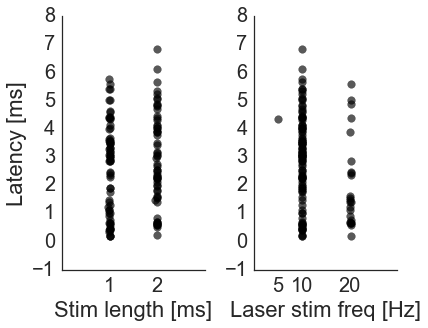

In [197]:
# plot different stim protocols against outcome of stimulation 
sns.set(font_scale=2)
sns.set_style('white')
figure = plt.figure(figsize=(6,10))


ax1 = figure.add_subplot(2,2,1)
ax1.scatter(deep_layer_inhib_filtered.stim_length,deep_layer_inhib_filtered.change_point_ms,color='k',alpha=.65,s=60)
ax1.set_xlabel('Stim length [ms]')
ax1.set_ylabel('Latency [ms]')
ax1.set_xlim(0,3)
locs = ax1.get_xticks() 
ax1.set_xticks([locs[2],locs[4]]) 

ax2 = figure.add_subplot(2,2,2)
ax2.scatter(deep_layer_inhib_filtered.stim_freq,deep_layer_inhib_filtered.change_point_ms,color='k',alpha=.65,s=60)
ax2.set_xlabel('Laser stim freq [Hz]')
ax2.set_xlim(0,30)
locs = ax2.get_xticks() 
ax2.set_xticks([locs[1],locs[2],locs[4]]) 

figure.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.35, hspace=None)
sns.despine()

### time of inhibition and firing properties of inhibited vs. excited cells and occurence of stimulation frequency/length vs. inhibition

157


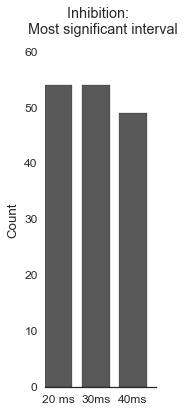

In [198]:
print(len(deep_layer_inhib_filtered))

sns.set(font_scale=1.2)
sns.set_style('white')
figure = plt.figure(figsize=(2,6))

twenty_ms = len(deep_layer_inhib_filtered[deep_layer_inhib_filtered.inhib_lowest_p_interval == 20])
thirty_ms = len(deep_layer_inhib_filtered[deep_layer_inhib_filtered.inhib_lowest_p_interval == 30])
fourty_ms = len(deep_layer_inhib_filtered[deep_layer_inhib_filtered.inhib_lowest_p_interval == 40])
ind = np.arange(3)  # the x locations for the groups
width = 0.75                 
ax1 = figure.add_subplot(1,1,1)
ax1.bar(ind,[twenty_ms,thirty_ms,fourty_ms],width,color='k',alpha=.65)


ax1.set_ylabel('Count')
ax1.set_title('Inhibition: \n Most significant interval',y=1.04)
ax1.set_xticks(ind + width / 2)
ax1.set_xticklabels(('20 ms', '30ms', '40ms'))
sns.despine(left=True)
plt.show()

### Firing frequencies? 

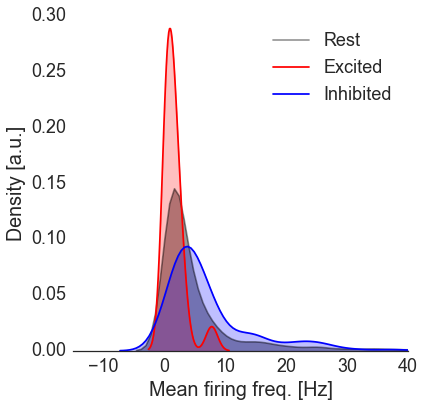

In [199]:
sns.set(font_scale=1.8)
sns.set_style('white')
figure = plt.figure(figsize=(6,6))
ax = figure.add_subplot(1,1,1)
ax = sns.kdeplot(spiketimes_tracking_cells.mean_freq[(autocorr_cells.excited == False) & (autocorr_cells.inhibited == False)], 
                 shade=True, color="k",label='Rest',alpha=.4)
ax = sns.kdeplot(spiketimes_tracking_cells.mean_freq[autocorr_cells.excited == True], shade=True, color="r",label='Excited')
ax = sns.kdeplot(spiketimes_tracking_cells.mean_freq[autocorr_cells.inhibited == True], shade=True, color="b",label='Inhibited')
ax.set_xlabel('Mean firing freq. [Hz]')
ax.set_ylabel('Density [a.u.]')
ax.set_xlim(-15,40)
sns.despine(left=True)